In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread('00-puppy.jpg')

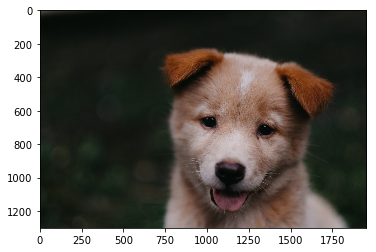

In [5]:
plt.imshow(img[:,:,::-1])

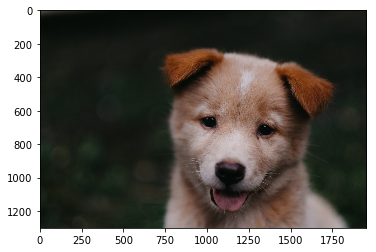

In [6]:
# another way to update the RGB sequence 

img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
plt.imshow(img)

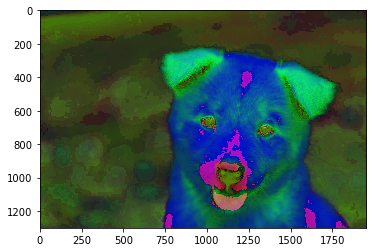

In [7]:
img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
plt.imshow(img)

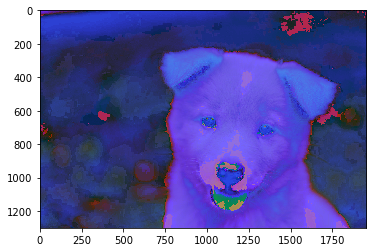

In [8]:
img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
plt.imshow(img)

In [11]:
# Blending and Pasting images
# simple formula
# new_pixel = alpha * pixel_1 + beta * pixel_2 + gamma

In [17]:
img1 = cv2.imread('dog_backpack.png')
img1 = img1[:,:,::-1]


img2 = cv2.imread('watermark_no_copy.png')
img2 = img2[:,:,::-1]

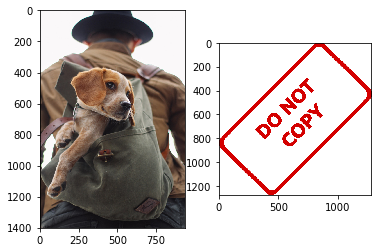

In [18]:
fig = plt.figure()
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(img1)
ax2.imshow(img2)


In [19]:
img1.shape,img2.shape

((1401, 934, 3), (1280, 1277, 3))

In [20]:
# Blending images of same size
img1 = cv2.resize(img1,(1200,1200))
img2 = cv2.resize(img2,(1200,1200))

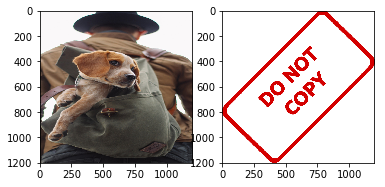

In [21]:
fig = plt.figure()
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(img1)
ax2.imshow(img2)

In [34]:
blended = cv2.addWeighted(src1=img1,alpha= .7, src2= img2, beta= 0.5, gamma = 0)

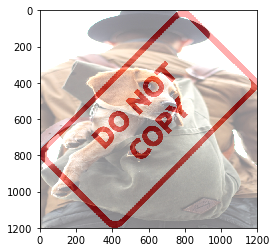

In [35]:
plt.imshow(blended)

In [37]:
## Overlay images of different sizes
## No blending 
## numpy reassignment
## small image on large image

## addWeighted function work only for same size images

In [38]:
img1 = cv2.imread('dog_backpack.png')
img1 = img1[:,:,::-1]


img2 = cv2.imread('watermark_no_copy.png')
img2 = img2[:,:,::-1]

In [39]:
img1.shape, img2.shape

((1401, 934, 3), (1280, 1277, 3))

In [41]:
img2 = cv2.resize(img2,(600,600))

In [42]:
# now both images are of different size
img1.shape, img2.shape

((1401, 934, 3), (600, 600, 3))

In [45]:
## Numpy will help in overlaying 

large_img = img1
small_img = img2

small_img.shape

(600, 600, 3)

In [46]:
x_offset  = 0
y_offset = 0

x_end = x_offset + small_img.shape[1]
y_end = x_offset + small_img.shape[0]

In [47]:
large_img[y_offset:y_end, x_offset:x_end] = small_img

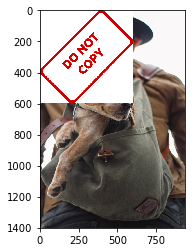

In [48]:
plt.imshow(large_img)

In [51]:
# start from scratch

img1 = cv2.imread('dog_backpack.png')
img1 = img1[:,:,::-1]


img2 = cv2.imread('watermark_no_copy.png')
img2 = img2[:,:,::-1]

img2 = cv2.resize(img2,(600,600))

In [52]:
# creating a ROI ( region of interest) in the large image

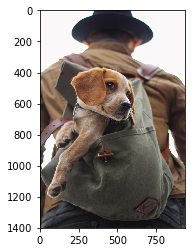

In [53]:
plt.imshow(img1)

In [54]:
img1.shape

(1401, 934, 3)

In [57]:
x_offset = 934 - 600
y_offset = 1401 -600



In [56]:
rows, cols , channels = img2.shape

In [58]:
roi =  img1[y_offset:1401, x_offset:934]

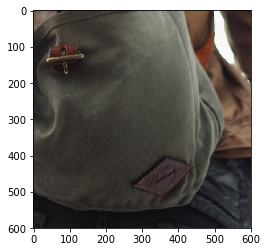

In [59]:
plt.imshow(roi)

In [60]:
img2_gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

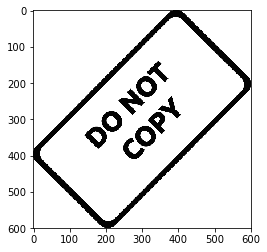

In [62]:
plt.imshow(img2_gray, cmap = 'gray')

In [63]:
mask_inv = cv2.bitwise_not(img2_gray)

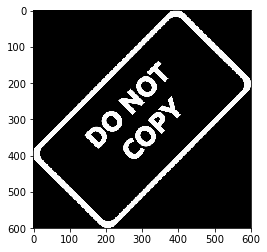

In [64]:
plt.imshow(mask_inv, cmap = 'gray')

In [65]:
mask_inv.shape

(600, 600)

In [85]:
white_background = np.full(img2.shape,255)

In [86]:
white_background.shape

(600, 600, 3)

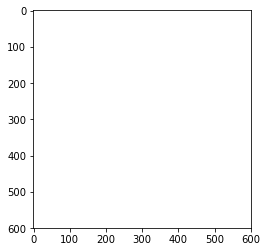

In [87]:
plt.imshow(white_background, cmap = 'gray')

In [88]:
bg = cv2.bitwise_or(white_background,white_background, mask=mask_inv)

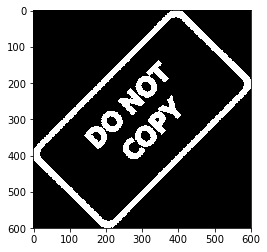

In [89]:
plt.imshow(bg, cmap = 'gray')

In [90]:
fg = cv2.bitwise_or(img2,img2, mask = mask_inv)

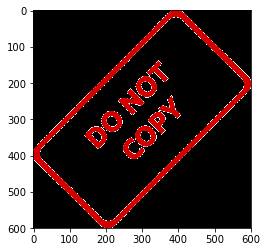

In [91]:
plt.imshow(fg, cmap = 'gray')

In [92]:
final_roi = cv2.bitwise_or(roi, fg)

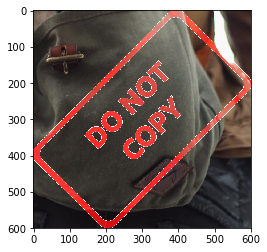

In [93]:
plt.imshow(final_roi, cmap = 'gray')

In [94]:
large = img1
small = final_roi

In [98]:
large[y_offset:y_offset+small.shape[0],x_offset:x_offset+small.shape[1]]= small

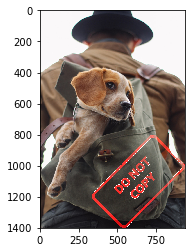

In [99]:
plt.imshow(large, cmap = 'gray')

In [101]:
## Done with overlaying two images 

----

In [102]:
## Image thresholding 

In [103]:
ran = cv2.imread('rainbow.jpg')

In [106]:
ran.shape

(550, 413, 3)

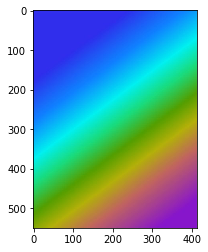

In [113]:
plt.imshow(ran)

In [109]:
ran1 = cv2.imread('rainbow.jpg',0) 
# by putting 0 , it reads in grayscale

In [110]:
ran1.shape

(550, 413)

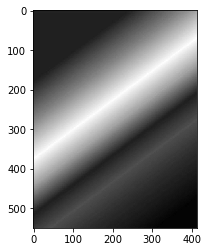

In [114]:
plt.imshow(ran1, cmap='gray')

In [123]:
ret, thresh = cv2.threshold(ran1,127,255,cv2.THRESH_BINARY_INV)

In [124]:
ret

127.0

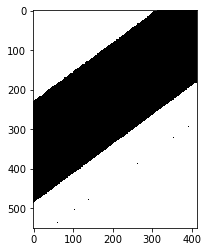

In [125]:
plt.imshow(thresh, cmap= 'gray')

In [126]:
ret, thresh = cv2.threshold(ran1,127,255,cv2.THRESH_TRUNC)

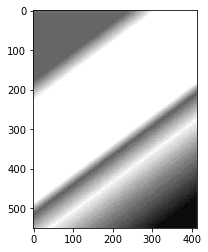

In [127]:
plt.imshow(thresh, cmap= 'gray')

In [128]:
ret, thresh = cv2.threshold(ran1,127,255,cv2.THRESH_TOZERO)

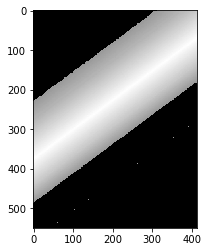

In [129]:
plt.imshow(thresh, cmap= 'gray')

In [130]:
ret, thresh = cv2.threshold(ran1,127,255,cv2.THRESH_TOZERO_INV)

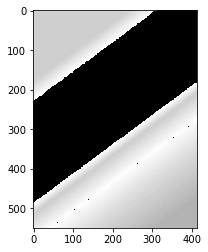

In [131]:
plt.imshow(thresh, cmap= 'gray')

In [135]:
img = cv2.imread('crossword.jpg',0)

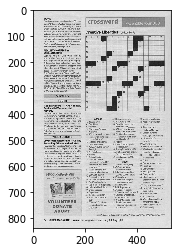

In [136]:
plt.imshow(img,cmap= 'gray')

In [137]:
def show_pic(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

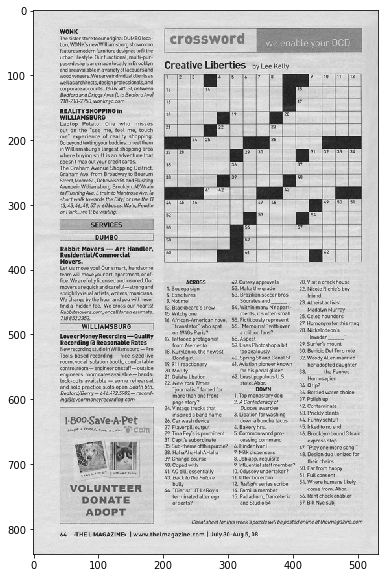

In [147]:
show_pic(img)

In [139]:

# it actually make sense when we really remove the unwanted information from the image, like at the borders emply space is gray, which can be turned into simple white. and same goes with the letters, it would be highligted more.

In [140]:
ret, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

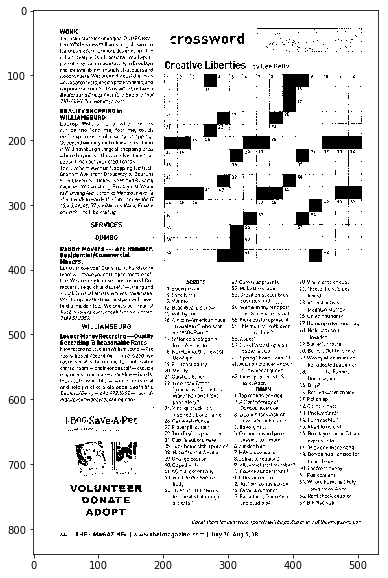

In [142]:
show_pic(thresh)

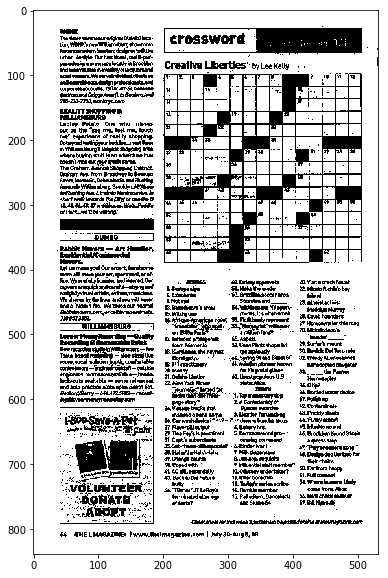

In [144]:
# to grab more ink, threshold to be increased

ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
show_pic(thresh)

In [145]:
# adaptive threshold

th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 8)

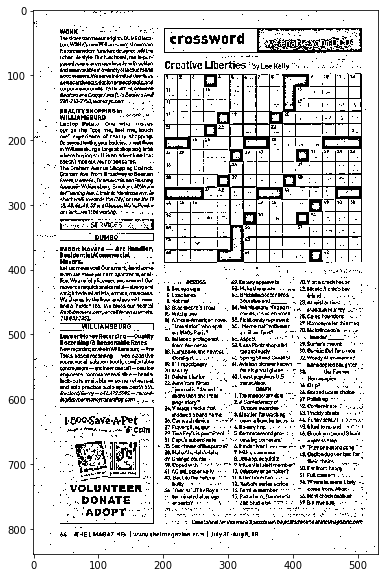

In [148]:
show_pic(th2)

In [151]:
# blending result of two different threshold results
blended = cv2.addWeighted(src1=thresh,alpha = 0.6, src2= th2, beta= 0.4, gamma =0)

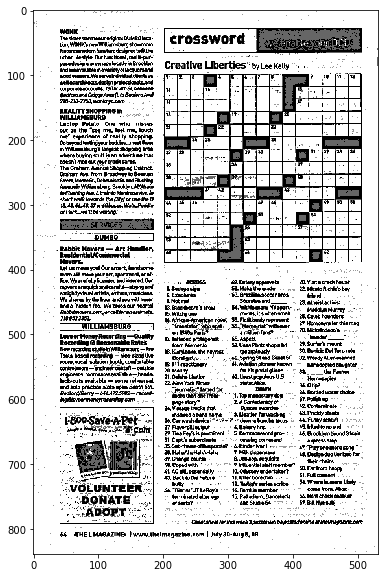

In [152]:
show_pic(blended)

In [154]:
# Blurring and smoothing
# Gamma correction
# Kernal based filters

In [155]:
def load_img():
    img = cv2.imread('bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

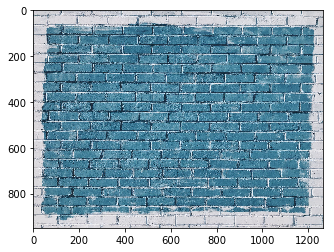

In [158]:
plt.imshow(load_img())

In [159]:
def show_pic(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

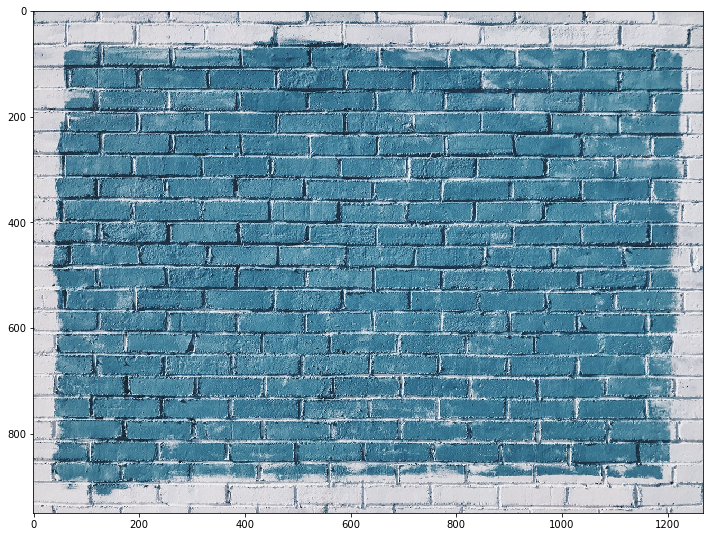

In [160]:
show_pic(load_img())

In [161]:
# gamma correction

gamma = 1/4

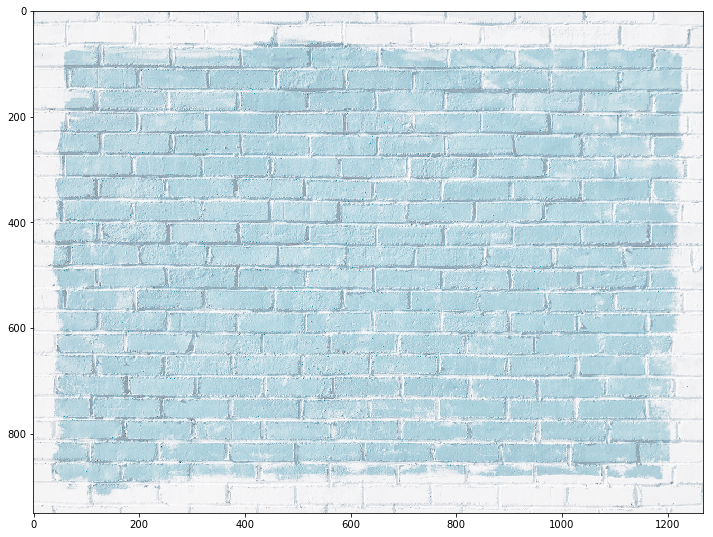

In [164]:
result = np.power(load_img(), gamma)
show_pic(result)

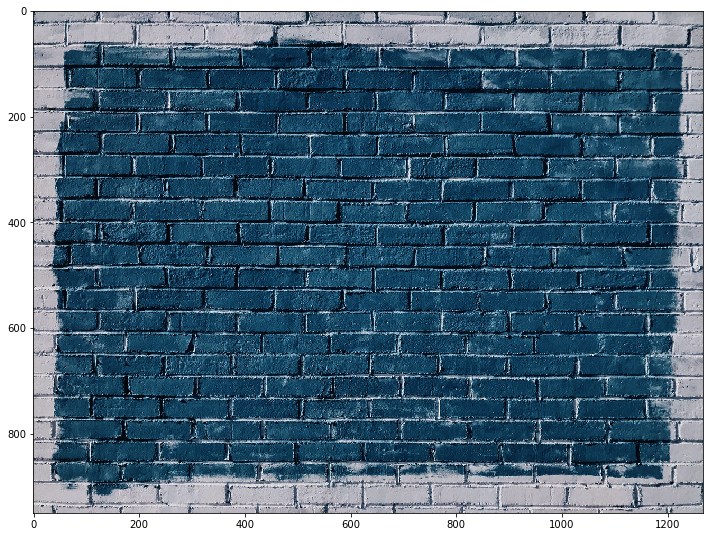

In [165]:
gamma = 2
result = np.power(load_img(), gamma)
show_pic(result)

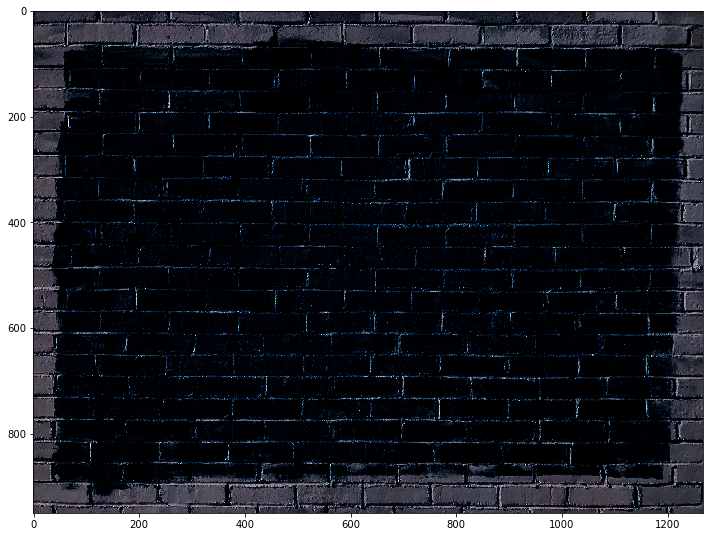

In [167]:
gamma = 8
result = np.power(load_img(), gamma)
show_pic(result)

In [168]:
# blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


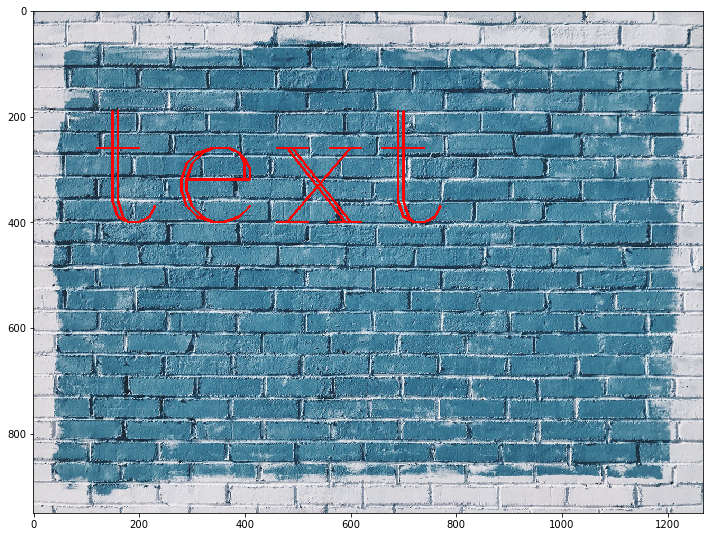

In [173]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text = 'text', org =(100,400),
           fontFace=font, fontScale = 10,color=(255,0,0), thickness = 4 )

show_pic(img)

In [195]:
kernel = np.ones((6,5), dtype=np.float32) / 10


In [196]:
kernel

array([[0.1, 0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1, 0.1]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


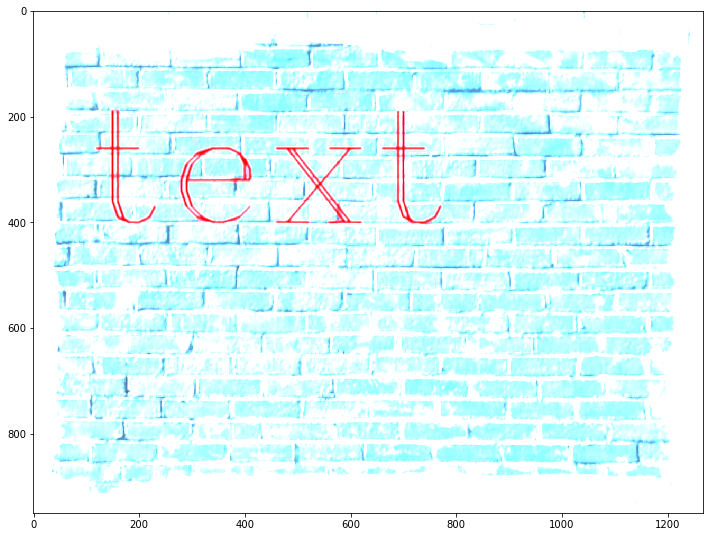

In [197]:
dst = cv2.filter2D(img,-1,kernel)
show_pic(dst)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


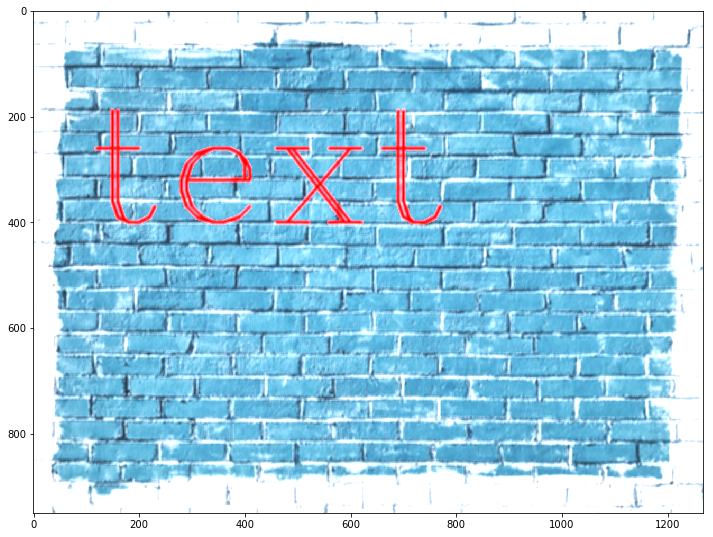

In [198]:
kernel = np.ones((6,5), dtype=np.float32) / 20
dst = cv2.filter2D(img,-1,kernel)
show_pic(dst)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


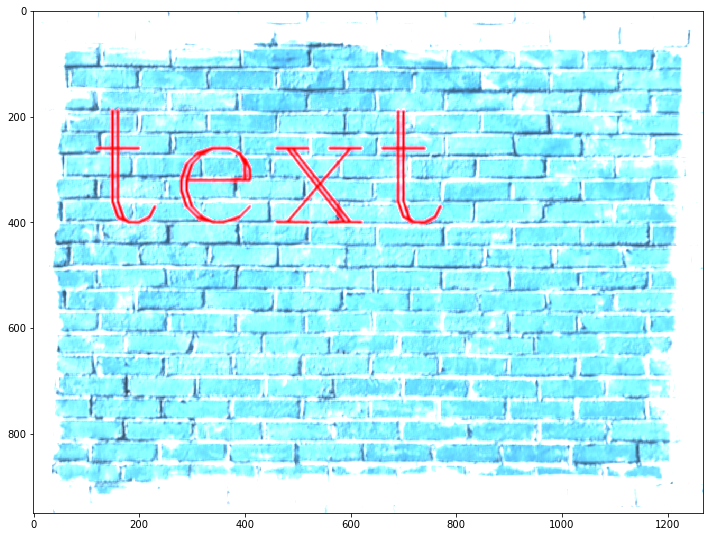

In [200]:
kernel = np.ones((6,5), dtype=np.float32) / 15
dst = cv2.filter2D(img,-1,kernel)
show_pic(dst)

In [202]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text = 'text', org =(100,400),
           fontFace=font, fontScale = 10,color=(255,0,0), thickness = 4 )
print ('back to normal')

back to normal


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


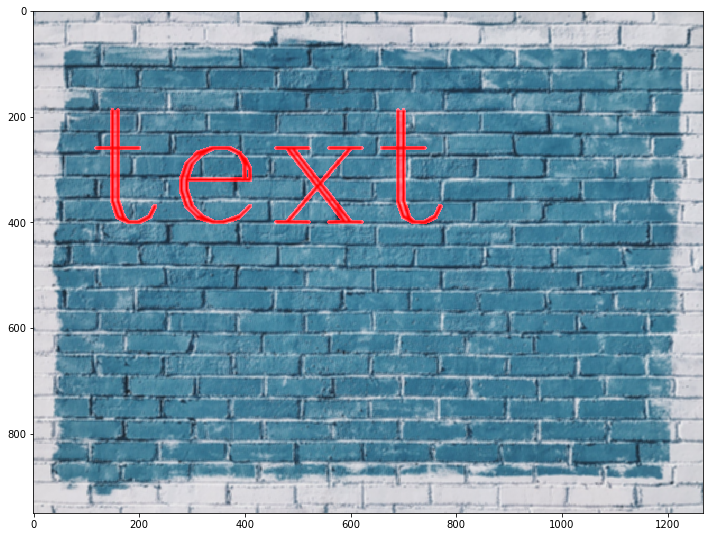

In [204]:
# both are same, this time is is inbuilt
blurred = cv2.blur(img, ksize = (5,5))
show_pic(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


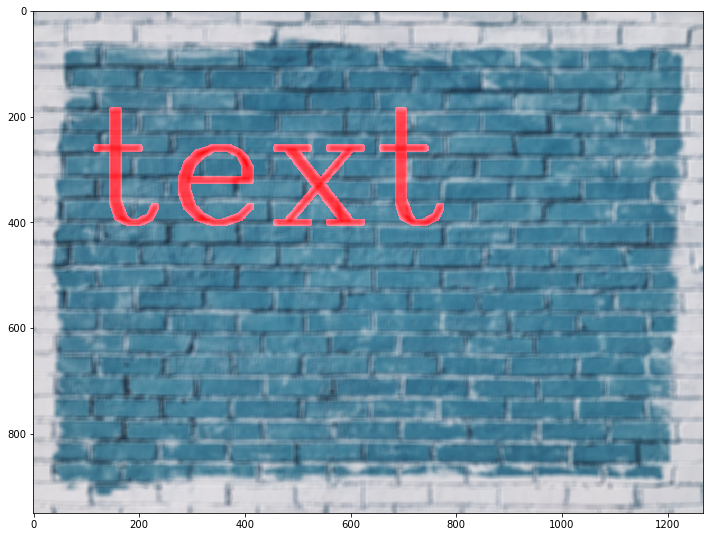

In [205]:
blurred = cv2.blur(img, ksize = (10,10))
show_pic(blurred)

In [206]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text = 'text', org =(100,400),
           fontFace=font, fontScale = 10,color=(255,0,0), thickness = 4 )
print ('back to normal')

back to normal


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


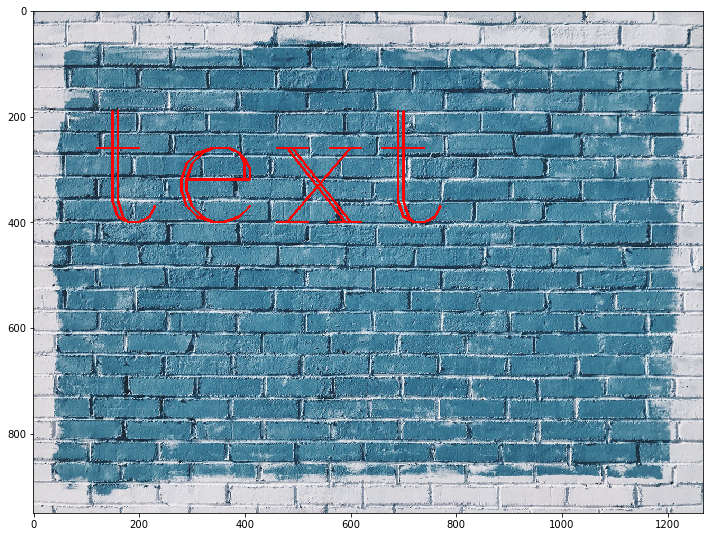

In [207]:
show_pic(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


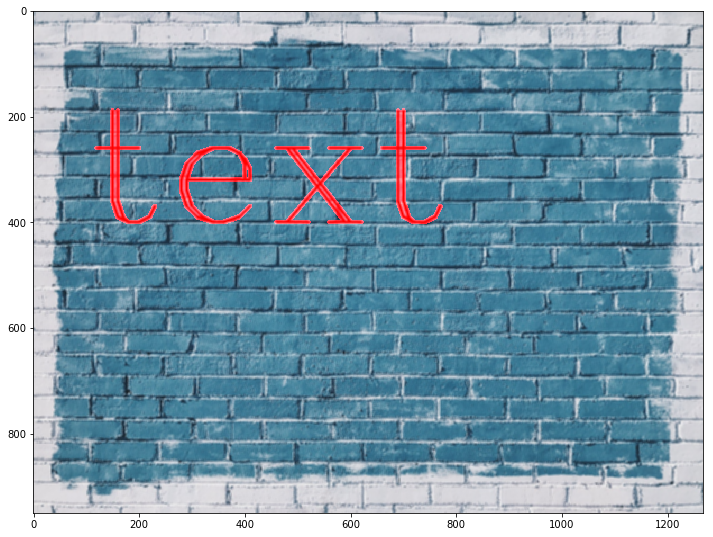

In [208]:
blurred_g = cv2.GaussianBlur(img,(5,5),10)
show_pic(blurred_g)

In [209]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text = 'text', org =(100,400),
           fontFace=font, fontScale = 10,color=(255,0,0), thickness = 4 )
print ('back to normal')

back to normal


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


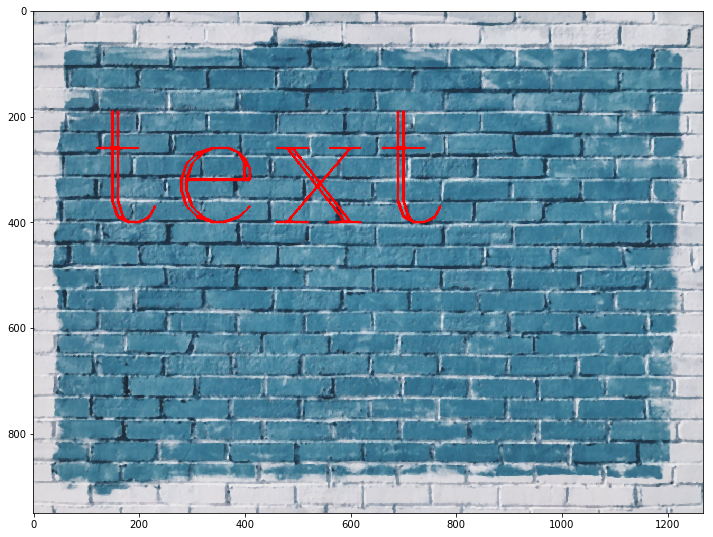

In [211]:
blurred_m=cv2.medianBlur(img, 5)
show_pic(blurred_m)

In [213]:
img = cv2.imread('sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

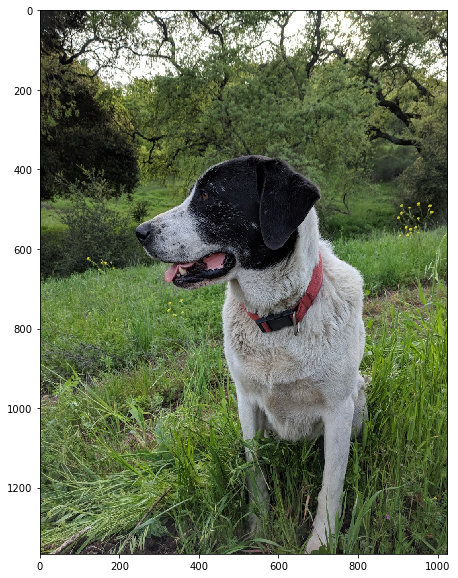

In [214]:
show_pic(img)

In [217]:
noise_img = cv2.imread('sammy_noise.jpg')

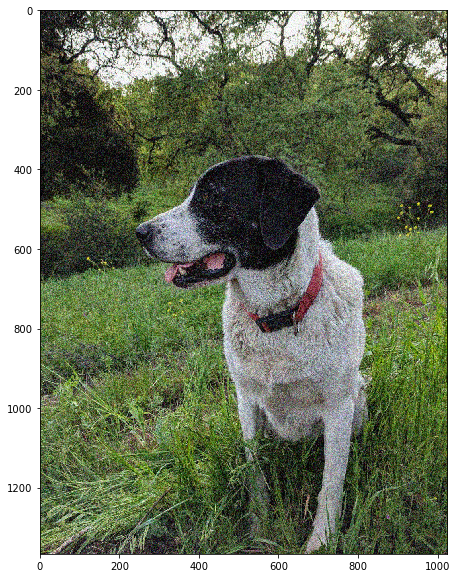

In [218]:
show_pic(noise_img)

In [219]:
median = cv2.medianBlur( noise_img, 5)

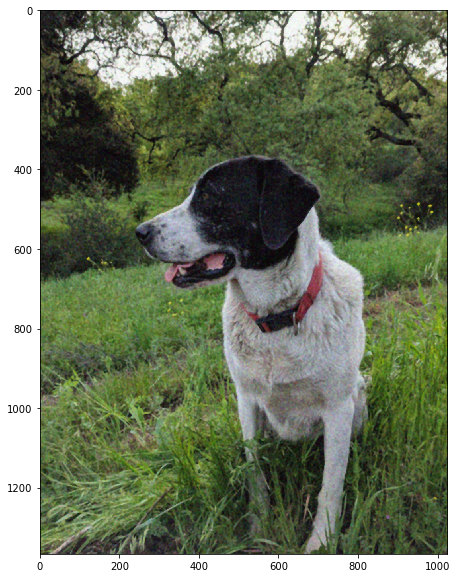

In [220]:
show_pic(median)

In [230]:
# reducing noise by morphological operators

def load_img():
    blank_img = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img,text = '12345', org = (50,250),fontFace= font, fontScale= 5,color = (255,0,0), thickness = 10)    
    return blank_img

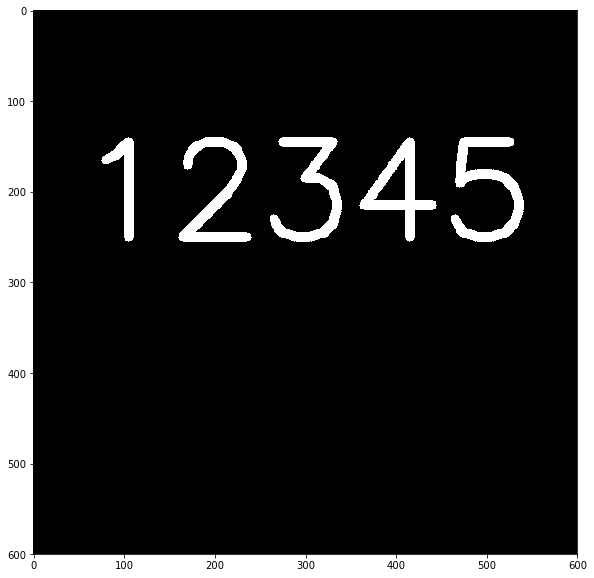

In [231]:
show_pic(load_img())

In [232]:
kernel = np.ones((5,5), dtype = np.uint8)

In [244]:
result = cv2.erode(load_img(), kernel, iterations = 2)

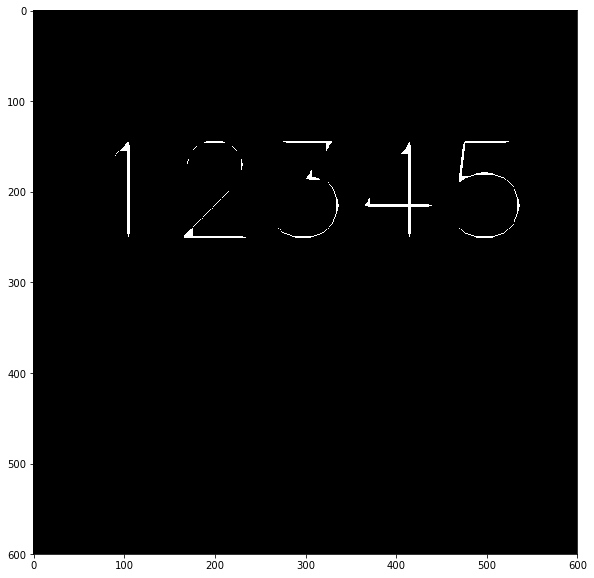

In [245]:
show_pic(result)